# 16. 흐린 사진을 선명하게

## 1. 들어가며
이미지 생성형 기술이 효과적으로 사용되는 사례로 저해상도의 이미지를 고해상도 이미지로 변환하는 Super Resolution을 꼽을 수 있습니다. 특히 GAN 관련 기술이 일반적인 CNN 기술보다 훨씬 정밀한 고해상도 이미지를 생성해 내는 데 효과적입니다. 하지만 고화질의 이미지를 생성해 내는 GAN 모델을 학습하는 것은 오랜 시간이 소요되는 과정입니다. 오늘은 모델학습 과정 자체보다는 모델의 구조와 특성, 그리고 잘 학습된 모델을 활용한 고해상도 변환을 체험하는 데 보다 중점을 두어 진행하게 될 것입니다.

### 데이터셋 다운로드
이번 학습에서 사용할 데이터셋을 먼저 다운로드받도록 하자. `tensorflow-datasets` 라이브러리가 설치되어 있지 않다면, 터미널을 열어 아래와 같이 라이브러리를 설치하자.

```python
$ pip install tensorflow-datasets
```

그리고 터미널로 python을 실행하고, 아래 두 줄의 코드를 실행하여 데이터를 다운로드받는다.

```python
$ python

>> import tensorflow_datasets as tfds 
>> tfds.load("div2k/bicubic_x4")
```

>_총 4GB가량의 데이터를 다운로드하는데 수십 분가량의 긴 시간이 소요되기 때문에, 이 다운로드는 가급적 별도의 터미널이나 주피터 화면에서 진행하시기를 권한다._

In [1]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [2]:
import tensorflow_datasets as tfds 

In [3]:
tfds.load("div2k/bicubic_x4")

{'train': <PrefetchDataset shapes: {hr: (None, None, 3), lr: (None, None, 3)}, types: {hr: tf.uint8, lr: tf.uint8}>,
 'validation': <PrefetchDataset shapes: {hr: (None, None, 3), lr: (None, None, 3)}, types: {hr: tf.uint8, lr: tf.uint8}>}

### 학습 전제
---
* 신경망의 학습 방법에 대한 전반적인 절차를 알고 있어야 한다.
* CNN, GAN에 대한 기본적인 개념을 알고 있어야 한다.
* Tensorflow에서 모델을 구성할 때 사용하는 Sequential, Functional API에 대해 알고 있어야 한다.
* Tensorflow의 GradientTape API를 이용한 학습 절차를 이해할 수 있어야 한다.

### 학습 목표
---
* Super Resolution과 그 과정 수행에 필요한 기본 개념을 이해한다.
* Super Resolution에 사용되는 대표적인 2개의 구조(SRCNN, SRGAN)에 대해 이해하고 활용한다.

### 목차
---
1. Super Resolution 이란??
2. Super Resolution의 활용 사례
3. Super Resolution을 어렵게 만드는 요인들
4. 가장 쉬운 Super Resolution
5. Deep Learning을 이용한 Super Resolution (1) SRCNN
6. Deep Learning을 이용한 Super Resolution (2) SRCNN 이후 제안된 구조들
7. SRCNN을 이용해 Super Resolution 도전하기
8. Deep Learning을 이용한 Super Resolution (3) SRGAN
9. SRGAN을 이용해 Super Resolution 도전하기
10. Super Resolution 결과 평가하기
11. SRCNN 및 SRGAN 결과 비교하기
12. 학습한 내용 정리하기
13. 프로젝트 : SRGAN 활용하기
> _이번 노드는 이미지를 활용하여 비교하는 코드가 많이 등장합니다. 사이드바[<<]를 접어서 학습하시길 권장한다._

## 2. Super Resolution 이란??
오늘은 인공지능이 활발하게 사용되는 기술 중 하나인 Super Resolution에 대해 살펴보고, 직접 활용해 보는 시간을 갖겠다. 많은 컴퓨터 비전 분야에서 딥러닝을 활용한 연구들이 좋은 결과를 기록하면서 오래전부터 많은 연구가 되어왔던 Super Resolution 분야 역시 딥러닝을 기반으로 큰 성장을 이루었고, 다양한 분야에서 활발하게 응용되고 있다.

먼저 Super Resolution이 무엇을 뜻하는지 알아보면서 오늘 학습을 시작해보자.

### Resolution? Super Resolution?
---
이번 학습의 "Super Resolution"에서 __Resolution__ 이란 무엇을 말하는 걸까? 아래 참고 자료를 읽자.

* 참고 자료: [모니터의 핵심, 디스플레이의 스펙 따라잡기](http://blog.lgdisplay.com/2014/03/%EB%AA%A8%EB%8B%88%ED%84%B0-%ED%95%B5%EC%8B%AC-%EB%94%94%EC%8A%A4%ED%94%8C%EB%A0%88%EC%9D%B4%EC%9D%98-%EC%8A%A4%ED%8E%99-%EB%94%B0%EB%9D%BC%EC%9E%A1%EA%B8%B0-%ED%95%B4%EC%83%81%EB%8F%84/)
* 참고 자료: [그림으로 쉽게 알아보는 HD 해상도의 차이](https://blog.lgdisplay.com/2014/07/%EA%B7%B8%EB%A6%BC%EC%9C%BC%EB%A1%9C-%EC%89%BD%EA%B2%8C-%EC%95%8C%EC%95%84%EB%B3%B4%EB%8A%94-hd-%ED%95%B4%EC%83%81%EB%8F%84%EC%9D%98-%EC%B0%A8%EC%9D%B4/)

__픽셀__
* 디스플레이를 구성하는 가장 작은 단위

__RGB 방식__
* 빛의 3원색을 혼합하여 색을 나타내는 방식

__픽셀과 해상도의 관계__
* 해상도는 가로 및 세로의 픽셀 수로 표기하며, 픽셀의 개수가 많을수록 고해상도가 되어 선명해진다.

사실 해상도에 대해 정확히 설명할 때에는 픽셀 수뿐만 아니라 픽셀의 크기 등을 고려해야 하지만, 오늘 학습할 내용에서 이 부분에 대해 자세히 다루지는 않겠다. 일반적으로 아래 그림처럼 해상도가 높다면 같은 화면이라도 더욱 선명하게 보인다.

<img src="./image/fhd_uhd.png" />

영상을 이용해 어떠한 일을 하는지에 따라 영상 정보의 손실을 최대한 줄이기 위해 고해상도 영상을 필요로 할 수 있으며, 흔히 YouTube 영상을 시청하는 경우도 고해상도 영상을 선호한다. 아마도 대부분은 아래 그림처럼 가능한 가장 높은 화질의 옵션을 선택하여 훨씬 더 깔끔한 화면으로 YouTube 영상을 이용하고 있을 것이다.

<img src="./image/youtube.png" alt="youtube"/>

이렇듯 대부분이 고해상도 영상을 원하지만 항상 좋은 점만 있는 건 아니다. 고해상도 영상은 저해상도 영상보다 크기가 훨씬 더 크기 때문에 인터넷 환경에 따라 전송에 많은 시간이 필요하다. 고해상도의 YouTube 영상을 보려다 중간중간 잦은 로딩과 버벅임으로 답답했던 경험은 누구나 한 번쯤 있을 것다. 이 경우 쉽게 해결할 수 있는 방법 중 하나는 해상도를 약간(?) 포기하고 영상을 시청하는 것이다.

이런 경우에 오늘 학습할 Super Resolution 기술은 좋은 해결 방법 중 하나가 될 수 있다. __Super Resolution__이란 저해상도 영상을 고해상도 영상으로 변환하는 작업 또는 그러한 과정을 말한다. 우리 말로 번역해서 "초해상화"라는 용어로도 사용되곤 한다. Super Resolution은 수많은 컴퓨터 비전 연구 분야 중 하나로 고해상도 디스플레이의 발전에 따라 지금까지 많은 관심을 받아 왔다.

저해상도의 YouTube 영상을 빠르게 받아 Super Resolution 기술로 고해상도 영상을 생성할 수 있다면 최악의 인터넷 환경에서도 충분히 고해상도의 영상을 시청할 수 있다. Super Resolution 기술은 우리 실생활에서 유용하게 사용될 수 있는 매력적인 기술이다.

## 3. Super Resolution의 활용 사례
Super Resolution이 어떤 분야에 활발하게 사용되는지 몇 가지 사례를 통해 알아보자.

<img src="./image/white_tower.png" alt="white_tower"/>

우리나라에서 가장 대표적으로 꼽히는 Super Resolution 활용 사례는 <하얀거탑>이라는 드라마의 리마스터링이다. 2007년 처음 방송 당시 HD 화질로 송출되었던 <하얀거탑>은 UHD 화질로 향상되어 2018년 재방송 되었다. 여기에는 Super Resolution 기술뿐만 아니라 노이즈 제거 등의 여러 작업이 거쳐졌다고 한다. 이에 대해 자세히 알고 싶다면 [하얀거탑 리마스터링 제작기](http://tech.kobeta.com/%ED%95%98%EC%96%80%EA%B1%B0%ED%83%91-uhd-%EB%A6%AC%EB%A7%88%EC%8A%A4%ED%84%B0%EB%A7%81-%EC%A0%9C%EC%9E%91%EA%B8%B0/)를 자세히 읽어보자.

<img src="./image/cctv.png" alt="cctv" />

감시 및 보안 시스템에서 흔히 사용되는 CCTV는 대상의 거리가 멀어짐에 따라 획득한 영상의 해상도가 저하되는 현상이 발생한다. 정보 손실이 많은 저해상도 영상을 활용한다면 차량의 번호판이나 얼굴을 인식하는 데 큰 어려움을 겪거나 심지어 인식 자체가 불가능할 수 있다. 이러한 문제를 극복하기 위해 Super Resolution 기술을 적용하여 고해상도 이미지를 생성해 인식 성능을 높이려는 많은 연구가 진행되고 있다.

<img src="./image/medical.png" alt="medical" />

높은 해상도를 갖는 의료 영상을 이용하면 구조 정보를 상세하게 관찰할 수 있으므로, 정량적인 이미지 분석 및 진단 등의 의사 결정에 많은 도움을 줄 수 있다. 일반적으로 고해상도의 의료 영상을 얻는데 매우 긴 스캔 시간이 필요하거나, 많은 방사선이 환자의 몸에 노출되어 다른 부작용을 초래할 수 있다. Super Resolution 기술은 이러한 단점을 극복할 수 있는 기술 중 하나로 사용된다.

## 4. Super Resolution을 어렵게 만드는 요인들
이번에는 Super Resolution을 진행하여 좋은 결과를 얻어내도록 신경망을 학습시키는 데 몇 가지 어려운 사항들에 대해 알아보자.

<img src="./image/hard.png" alt="hard" />

첫 번째 어려운 점은 하나의 저해상도 이미지에 대해 여러 개의 고해상도 이미지가 나올 수 있다는 것이다. 위 그림은 1개의 저해상도 이미지(상단 이미지)에 대응하는 3개의 고해상도 이미지(하단 이미지)를 나타냈다. 3개의 고해상도 이미지 사이에서는 눈으로 볼 때 거의 차이를 나타내지 않지만, 아래 확대한 이미지를 보면 세부적으로 픽셀의 값이 각각 다른 것을 알 수 있다. 하나의 저해상도 이미지를 고해상도 이미지로 만드는데 매우 다양한 경우의 수가 있다는 것은 Super Resolution이 가진 큰 특징이며, 이러한 문제를 `ill-posed (inverse) problem`이라 부른다.

일반적으로 Super Resolution 모델을 학습시키기 위한 데이터를 구성하는 과정은, 먼저 고해상도 이미지를 준비하고 특정한 처리 과정을 거쳐 저해상도 이미지를 생성하며, 생성된 저해상도 이미지를 입력으로 원래의 고해상도 이미지를 복원하도록 학습을 진행한다.

<img src="./image/hard2.png" alt="hard" />

두 번째 어려운 점은 Super Resolution 문제의 복잡도이다. 위 그림은 2x2 크기의 이미지를 이용해 3x3, 4x4, 5x5 크기의 이미지로 Super Resolution 하는 과정을 간략하게 나타냈다. 녹색으로 나타난 2x2 이미지 픽셀을 입력으로 3x3 크기의 이미지 만드는 경우 새롭게 생성해야 하는 정보는 최소 5개 픽셀(회색)이며, 4x4의 경우 12개, 5x5의 경우 21개의 정보를 생성해야 한다. 원래 가진 제한된 정보(녹색 픽셀)만을 이용해 많은 정보(회색 픽셀)를 만들어내는 과정은 매우 복잡하며 그만큼 잘못된 정보를 만들어 낼 가능성 또한 높다. 이 문제는 원래 가진 이미지의 해상도 보다 더욱더 높은 해상도로 Super Resolution 할수록 점점 심해진다.

<img src="./image/hard3.png" alt="hard" />

위 이미지의 첫 번째 및 네 번째 이미지는 저해상도 및 고해상도 이미지를 나타내며, 두 번째 및 세 번째 이미지는 각각 다른 딥러닝 모델을 이용해 Super Resolution 하여 생성한 결과 이미지이다. 딥러닝 방법을 사용한 결과(두 번째 및 세 번째 이미지)를 비교한다면, 시각적으로 어떤 이미지가 더 고해상도에 가까운가? 대부분 `결과 2` 이미지가 분명 더욱 세밀한 정보를 잘 표현하여 해상도가 높다고 생각할 수 있다. 많은 Super Resolution 연구에서 사용되는 두 개의 정량적 평가 결과가 두 번째 및 세 번째 이미지 제목에 나타나 있다. `결과 2`의 이미지에 세밀한 정보가 잘 표현되었다고 생각했지만 실제 평가 결과는 `결과 1` 이미지에 쓰인 숫자가 더 높은 것을 확인할 수 있다. 이 평가 척도는 각각 높을수록 더 원본 이미지와 비슷함을 말하며, 정량적으로 `결과 1`이 더 좋은 결과라는 뜻이다. (이러한 평가 척도에 대해서는 이후 단계에서 다룰 예정) 마지막으로 Super Resolution을 수행하는 데 어려운 점은 위 그림과 같이 결과를 평가하는 데 있어 흔히 사용되는 정량적 평가 척도와 사람이 시각적으로 관찰하여 내린 평가가 잘 일치하지 않는다는 것이다.

## 5. 가장 쉬운 Super Resolution
Super Resolution을 수행하는 가장 쉬운 방식은 __Interpolation__ 을 이용하는 것이다. 아래 링크에서 이에 대해 알아보자. (수식은 자세히 이해 못해도 괜찮다.)

* 참고 자료: [선형보간법과 삼차보간법, 제대로 이해하자](https://bskyvision.com/789)

__interpolation__
* 알려진 두 점 사이의 특정 지점에 대한 값을 추정하는 방법

__Linear interpolation과 Bilinear interpolation의 차이점__
* Linear interpolation을 2차원으로 확장한 것이 bilinear interpolation입니다. Linear interpolation의 경우 2개의 값을 이용해 새로운 픽셀을 예측하며, bilinear interpolation은 4개의 값을 이용한다.

아래 링크에서는 bilinear interpolation을 직접 계산해 볼 수 있다.

* 참고 자료: [Bilinear interpolation 예제](https://blog.naver.com/dic1224/220882679460)
이번에는 opencv 라이브러리를 이용해 interpolation을 적용해보자. 적용할 이미지는 scikit-image에서 제공하는 예제 이미지를 사용할 것이다. 만약 두 라이브러리가 설치되어 있지 않다면 아래와 같이 먼저 설치하자.

```bash
$ pip install opencv-python
$ pip install scikit-image
```

아래 코드를 이용해 scikit-image에 살고있는 고양이를 잠시 데려오자.

(300, 451, 3)


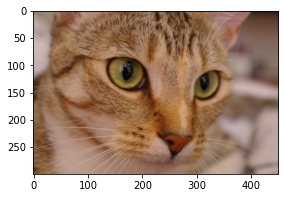

In [4]:
from skimage import data
import matplotlib.pyplot as plt

hr_image = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_image.shape[:2]

print(hr_image.shape) # 이미지의 크기를 출력합니다.

plt.figure(figsize=(6,3))
plt.imshow(hr_image)

이 고양이 이미지의 크기는 (세로 픽셀 수 x 가로 픽셀 수 x 채널 수) 가 [300 x 451 x 3] 으로 확인된다. Interpolation을 통해 고양이를 매우 쉽게 Super Resolution 해보자.

우선 불러온 고양이가 꽤나 선명하기 때문에 일부러 크기를 줄여 저해상도로 낮춰보자. `opencv` 라이브러리의 `resize()`를 이용해 이미지의 크기를 조절할수 있다. 아래 코드에서는 고양이를 '100 x 150 x 3' 크기로 줄인다. `dsize`의 설정값에 따라 크기를 조절하는데, 주의할 점은 변환하고자 하는 이미지의 크기를 _(가로 픽셀 수, 세로 픽셀 수)_ 로 지정해줘야 한다.



(100, 150, 3)


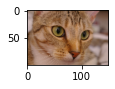

In [5]:
import cv2
lr_image = cv2.resize(hr_image, dsize=(150,100)) # (가로 픽셀 수, 세로 픽셀 수)

print(lr_image.shape)

plt.figure(figsize=(3,1))
plt.imshow(lr_image)

작아진 고양이 이미지로 Interpolation 방법을 적용해 Super Resolution을 시도해보겠다. `resize()`내의 `interpolation` 설정에 따라 적용 방법을 조절할 수 있다. 아래 코드는 이전에 간략하게 알아보았던 bilinear 및 bicubic interpolation을 적용해 이미지를 '400 x 600 x 3' 크기로 크게 변환하는 예제이다.

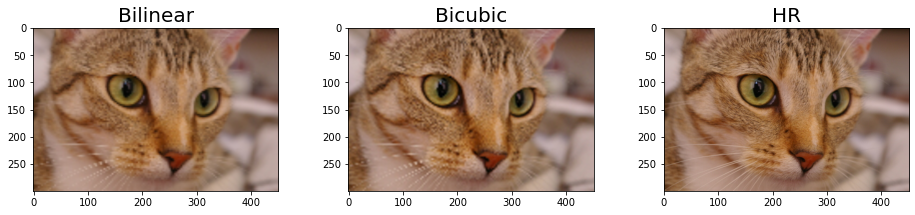

In [6]:
bilinear_image = cv2.resize(
    lr_image, 
    dsize=(451, 300), # (가로 픽셀 수, 세로 픽셀 수) 
    interpolation=cv2.INTER_LINEAR # bilinear interpolation 적용
)

bicubic_image = cv2.resize(
    lr_image, 
    dsize=(451, 300), # (가로 픽셀 수, 세로 픽셀 수)
    interpolation=cv2.INTER_CUBIC # bicubic interpolation 적용
)

images = [bilinear_image, bicubic_image, hr_image]
titles = ["Bilinear", "Bicubic", "HR"]

plt.figure(figsize=(16,3))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

이외 다른 interpolation 방법을 적용하고 싶다면 아래 링크를 참고.

* 참고 자료: [OpenCV Documentation](https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#ga5bb5a1fea74ea38e1a5445ca803ff121)

Bilinear 및 bicubic interpolation을 적용한 이미지와 원래 고해상도 이미지(위 그림의 HR)를 시각화했다. 이미지가 작아 시각적으로 해상도에 큰 차이가 없어 보인다. 아래 코드를 이용해 특정 부분을 잘라내어 시각화해보자.

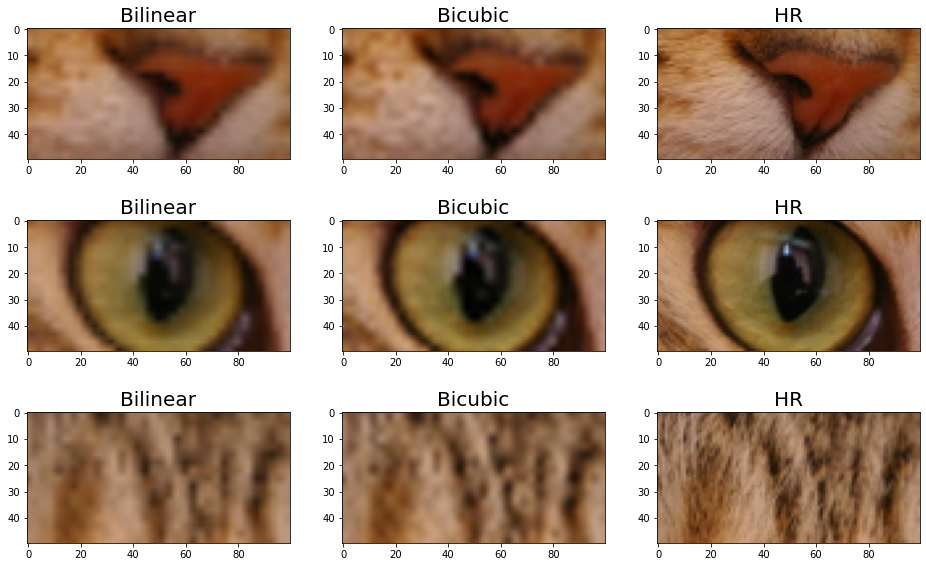

In [7]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]


# 잘라낼 영역의 좌표를 정의합니다.
left_tops = [(220,200)] *3 + [(90,120)] *3 + [(30,200)] *3

plt.figure(figsize=(16,10))
for i, (image, left_top, title) in enumerate(zip(images*3, left_tops, titles*3)):
    plt.subplot(3,3,i+1)
    plt.imshow(crop(image, left_top))
    plt.title(title, fontsize=20)

Interpolation 방법을 이용한 Super Resolution 결과는 어떤가? 이미지만 크게 만들어줄 뿐 세밀한 정보는 거의 찾아볼 수 없는 것을 확인할 수 있다.

위와 같은 interpolation 방법은 많은 딥러닝 기반 Super Resolution 연구에서 결과를 비교하기 위해 수행된다. 이제부터는 딥러닝 기반 Super Resolution에 대해 간략히 알아보고 실험해보겠다. 그리고 방금 수행한 interpolation 방법과 비교하여 딥러닝을 사용하는 것이 얼마나 성능이 좋은지 한번 직접 느껴보자

## 6. Deep Learning을 이용한 Super Resolution (1) SRCNN
__SRCNN__은 2014년 발표된 _"Image Super-Resolution Using Deep Convolutional Networks"_ 논문에서 사용되었다. __S__uper __R__esolution __C__onvolutional __N__eural __N__etworks의 앞글자를 따서 __SRCNN__이라고 불리며, 매우 간단한 모델 구조를 사용했음에도 기존 결과에 비해 큰 성능 향상을 이뤄냈다. 지금 이 연구를 보면 너무 간단해 보이지만, Super Resolution 문제에 가장 처음 딥러닝을 적용한 연구로써 이후 많은 딥러닝 기반의 Super Resolution 연구에 큰 영향을 준 정말 멋진 작품이다.

아래 그림이 __SRCNN__ 구조이다. 간략하게 살펴보자.

<img src="./image/srcnn.png" alt="srcnn" />

가장 먼저 저해상도 이미지(그림의 LR)를 bicubic interpolation 하여 원하는 크기로 이미지를 늘린다. SRCNN은 이 이미지(그림의 ILR)를 입력으로 사용한다. 이후 3개의 convolutional layer를 거쳐 고해상도 이미지를 생성해낸다. 생성된 고해상도 이미지와 실제 고해상도 이미지 사이의 차이를 역전파 하여 신경망의 가중치를 학습한다. 최근 발표되는 수 백 개 이상의 convolutional layer를 갖는 CNN과 비교하면 SRCNN은 매우 간단하다.

SRCNN이 발표된 지 꽤 오랜 시간이 흘렀고, 딥러닝 기반 Super Resolution 분야에서 대표적인 연구로 꼽히는 만큼 이 연구에 대해 정리된 자료들이 매우 많다. 아래 SRCNN에 대해 설명한 참고 자료를 읽어보자.

* 참고 자료: [논문리뷰 - SRCNN](https://d-tail.tistory.com/6)

__SRCNN 구성__
* 1) Patch extraction and representation : 저해상도 이미지에서 patch를 추출한다.
* 2) Non-linear mapping : Patch를 다른 차원의 patch로 비선형 매핑한다.
* 3) Reconstruction : Patch로부터 고해상도 이미지를 생성한다.

__SRCNN의 학습에 사용되는 손실함수(loss function)__
* Mean Squared Error

## 7. Deep Learning을 이용한 Super Resolution (2) SRCNN 이후 제안된 구조들

SRCNN 이후 정말 많은 Super Resolution 연구들이 있었으며, 어떠한 방식으로 발전해왔는지 몇 개의 연구들만 간략하게 알아보자. 아래 방법들은 일반적인 CNN의 발전 과정과 크게 다르지 않으며, Super Resolution뿐만 아니라 많은 컴퓨터 비전 분야에서 사용되는 방법들과 유사하다.

#### VDSR (Very Deep Super Resolution)

<img src="./image/vdsr.png" alt="VDSR" />

SRCNN과 동일하게 interpolation을 통해 저해상도 이미지의 크기를 늘려 입력으로 사용한다. 이전보다 훨씬 많은 20개의 convolutional layer를 사용했고, 최종 고해상도 이미지 생성 직전에 처음 입력 이미지를 더하는 residual learning을 이용했다. 이러한 깊은 구조를 이용해 SRCNN에 비해 큰 성능 향상을 이끌어 냈다.

#### RDN (Residual Dense Network)

<img src="./image/rdn.png" alt="RDN" />

이전 구조보다 그림이 조금 복잡해졌다. RDN은 저해상도 이미지가 입력되면, 여러 단계의 convolutional layer를 거치는데 각 layer에서 나오는 출력을 최대한 활용하도록 한다. 그림과 같이 각각의 convolution layer 출력 결과로 생성된 특징들이 화살표를 따라 이후 연산에서 여러 번 재활용 하는 것을 볼 수 있다. (한 곳으로부터 나온 화살표가 여러 곳을 향하고 있다)

#### RCAN (Residual Channel Attention Networks)

<img src="./image/rcan.png" alt="RCAN" />

그림이 더 복잡해졌다. RCAN 구조 또한 많은 convolutional layer를 거치며 학습한다. 위 구조들과 다른 특별한 점은 convolutional layer의 결과인 각각의 특징 맵을 대상으로 채널 간의 모든 정보가 균일한 중요도를 갖는 것이 아니라 일부 중요한 채널에만 선택적으로 집중하도록 유도했다 (맨 위의 Channel attention이라 쓰인 부분). CNN Attention 등의 키워드로 검색하면 RCAN 구조와 비슷한 많은 attention 기술에 대한 정보들을 찾아볼 수 있다.

## 8. SRCNN을 이용해 Super Resolution 도전하기
이번에는 앞서 간략하게 알아보았던 SRCNN을 구현하고 실험해보자. 맨 처음 시작했을 때 다운로드 한 데이터셋이 준비되어 있어야 한다.

`tensorflow-datasets` 라이브러리에서 사용해 볼 데이터셋은 `DIV2K` 이다. `DIV2K` 데이터셋은 많은 Super Resolution 연구에서 학습 및 평가에 사용되는 데이터셋이며 800개의 학습용 데이터셋 및 100개의 검증용 데이터셋으로 구성되어 있다.

앞서 다운로드 한 데이터셋은 `div2k/bicubic_x4` 이며, 이는 `DIV2K` 데이터셋 중에서 실제 고해상도 이미지를 대상으로 bicubic interpolation을 이용해 가로 및 세로 픽셀 수를 1/4배로 줄인 데이터셋 이다. 이렇게 만들어진 저해상도 이미지와 원래 고해상도 이미지가 서로 한 쌍으로 구성되어 있다.

데이터셋에 대한 자세한 정보는 아래에서 확인할 수 있다.

* 참고 자료: [DIV2K datasets](https://data.vision.ee.ethz.ch/cvl/DIV2K/)

> _아래에서 진행하는 SRCNN의 구현 및 학습 과정은 매우 간단한 과정만을 거치며, 실제 SRCNN 논문에서 진행한 방식과 세부적으로 차이가 있다._

### 데이터 준비하기
아래 코드를 이용해 DIV2K 데이터셋을 불러온다. 아래 코드에서 생성한 train과 valid는 각각 저해상도 및 고해상도 이미지를 쌍으로 담고 있다. 그중 한 쌍의 이미지에 대해 시각화해보자. 저해상도 이미지를 bicubic interpolation하여 고해상도 이미지와 동일한 크기로 만들었다.

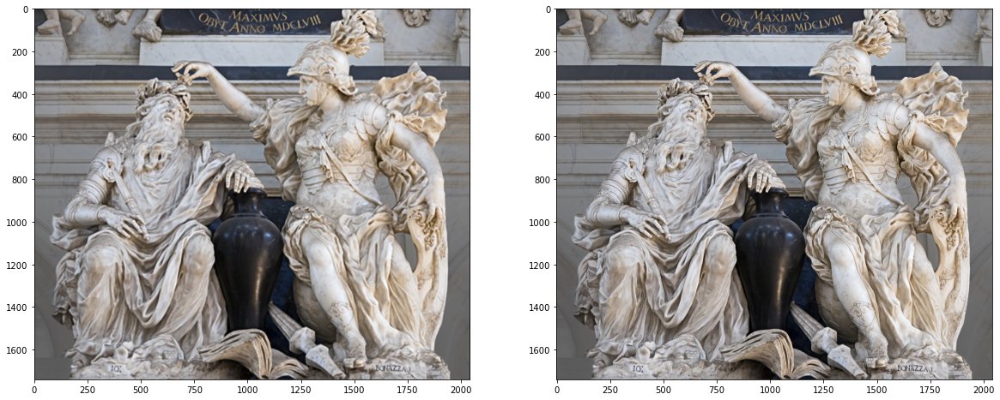

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

# 데이터를 불러옵니다.
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

# 시각화를 위해 한 개의 데이터만 선택합니다.
for i, (lr, hr) in enumerate(valid):
    if i == 6: break
    
# 저해상도 이미지를 고해상도 이미지 크기로 bicubic interpolation 합니다.  
hr, lr = np.array(hr), np.array(lr)
bicubic_hr = cv2.resize(
    lr, 
    dsize=(hr.shape[1], hr.shape[0]), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

# 저해상도 및 고해상도 이미지를 시각화합니다.
plt.figure(figsize=(20,10))
plt.subplot(1,2,1); plt.imshow(bicubic_hr)
plt.subplot(1,2,2); plt.imshow(hr)

이미지 크기가 꽤 크기 때문에 어렴풋이 봐서는 선명함의 차이가 크지 않은 것 같다. 아래 코드를 이용해 각 이미지의 특정 부분을 확대해보자.

Text(0.5, 1.0, 'HR')

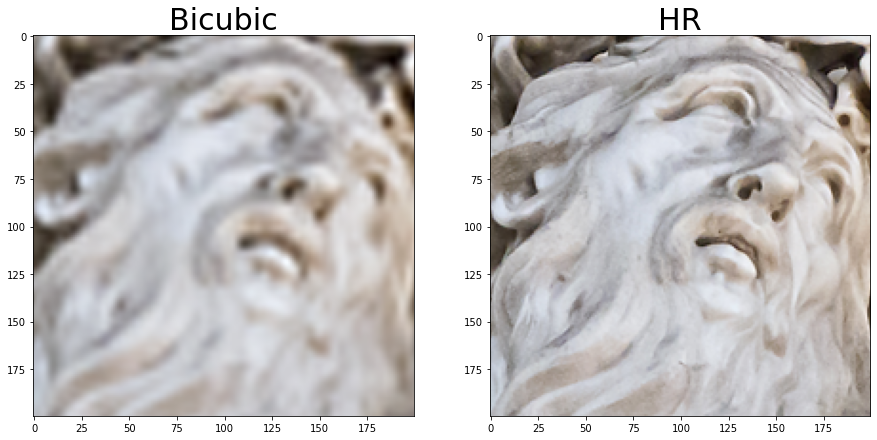

In [9]:
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.
def crop(image, left_top, x=200, y=200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

# interpolation된 이미지와 고해상도 이미지의 동일한 부분을 각각 잘라냅니다.
left_top = (400, 500)
crop_bicubic_hr = crop(bicubic_hr, left_top)
crop_hr = crop(hr, left_top)

# 잘라낸 부분을 시각화 합니다.
plt.figure(figsize=(15,25))
plt.subplot(1,2,1); plt.imshow(crop_bicubic_hr); plt.title("Bicubic", fontsize=30)
plt.subplot(1,2,2); plt.imshow(crop_hr); plt.title("HR", fontsize=30)

Bicubic interpolation 방법을 이용한 결과는 HR이라 쓰여진 실제 고해상도 이미지와 비교하면 매우 선명하지 않은 것을 확인 할 수 있다. SRCNN을 이용해 학습한 결과는 얼마나 좋을지 아래에서 확인해보자.

앞서 언급되었듯이 SRCNN의 입력은 저해상도 이미지를 그대로 사용하는 것이 아닌, 만들고자 하는 고해상도 이미지 크기에 맞게 interpolation이 적용된 이미지이다. 이 과정을 아래 코드와 같이 수행한다. 사용할 DIV2K 데이터셋 내의 개별 이미지 크기가 크므로, 일부 영역을 임의로 잘라내어 학습에 활용해 보겠다.

In [10]:
import tensorflow as tf

def preprocessing(lr, hr):
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr = tf.image.random_crop(hr, size=[96, 96, 3])
    hr = tf.cast(hr, tf.float32) / 255.
    
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄였다가
    # interpolation을 이용해 다시 원래 크기로 되돌립니다.
    # 이렇게 만든 저해상도 이미지를 입력으로 사용합니다.
    lr = tf.image.resize(hr, [96//4, 96//4], "bicubic")
    lr = tf.image.resize(lr, [96, 96], "bicubic")
    return lr, hr

train = train.map(preprocessing).shuffle(buffer_size=10).batch(16)
valid = valid.map(preprocessing).batch(16)

### SRCNN 구현하기
---
앞서 살펴본 대로 SRCNN은 3개 convolutional layer를 사용한 구조를 가지고 있다. 따라서 아래 코드와 같이 Sequential API를 활용해 간단하게 구현할 수 있다.

In [11]:
from tensorflow.keras import layers, Sequential

# 3개의 convolutional layer를 갖는 Sequential 모델을 구성합니다.
srcnn = Sequential()
# 9x9 크기의 필터를 128개 사용합니다.
srcnn.add(layers.Conv2D(128, 9, padding="same", input_shape=(None, None, 3)))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(64, 5, padding="same"))
srcnn.add(layers.ReLU())
# 5x5 크기의 필터를 64개 사용합니다.
srcnn.add(layers.Conv2D(3, 5, padding="same"))

srcnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 128)   31232     
_________________________________________________________________
re_lu (ReLU)                 (None, None, None, 128)   0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    204864    
_________________________________________________________________
re_lu_1 (ReLU)               (None, None, None, 64)    0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 3)     4803      
Total params: 240,899
Trainable params: 240,899
Non-trainable params: 0
_________________________________________________________________


### SRCNN 학습하기
---
최적화 방법과 손실 함수를 설정하고, 앞서 전처리한 데이터를 이용해 아래와 같이 간단하게 학습할 수 있다. 우선 1 epoch만 학습 시켜보자.

In [12]:
srcnn.compile(
    optimizer="adam", 
    loss="mse"
)

srcnn.fit(train, validation_data=valid, epochs=1)

50/50 [==============================] - 16s 326ms/step - loss: 0.0365 - val_loss: 0.0128


### SRCNN 테스트하기
SRCNN의 학습에는 꽤나 오랜시간이 소요되어 여기서 SRCNN을 처음부터 끝까지 학습시키지 않겠다. 대신 SRCNN을 사용해보기 위해 이미 학습이 완료된 SRCNN 모델을 준비했다. 아래 `srcnn.h5` 파일을 다운로드받은 후 코드를 실행하여 학습 완료된 모델을 불러올 수 있다.

```bash
$ mkdir -p ~/AIFFEL/Exploration/Practice/P16_SRGAN/super_resolution
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srcnn.h5
$ mv srcnn.h5 ~/AIFFEL/Exploration/Practice/P16_SRGAN/super_resolution
```

In [13]:
import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/AIFFEL/Exploration/Practice/P16_SRGAN/super_resolution/srcnn.h5'
srcnn = tf.keras.models.load_model(model_file)

아래 코드와 같이 저해상도 이미지를 입력받아 SRCNN을 사용하는 함수를 간단하게 정의하고, 이 함수를 이용해 SRCNN의 결과인 고해상도 이미지를 얻어보자.

In [14]:
def apply_srcnn(image):
    sr = srcnn.predict(image[np.newaxis, ...]/255.)
    sr[sr > 1] = 1
    sr[sr < 0] = 0
    sr *= 255.
    return np.array(sr[0].astype(np.uint8))

srcnn_hr = apply_srcnn(bicubic_hr)

이전 bicubic interpolation을 적용하고 이미지 전체를 시각화했을 때 세부적인 선명함이 눈에 띄지 않았기 때문에, 일부 영역을 잘라내어 시각적으로 비교해보겠다. 아래 코드를 이용해 3개 이미지(bicubic interpolation의 결과, SRCNN의 결과, 원래 고해상도 이미지)를 나란히 시각화한다.

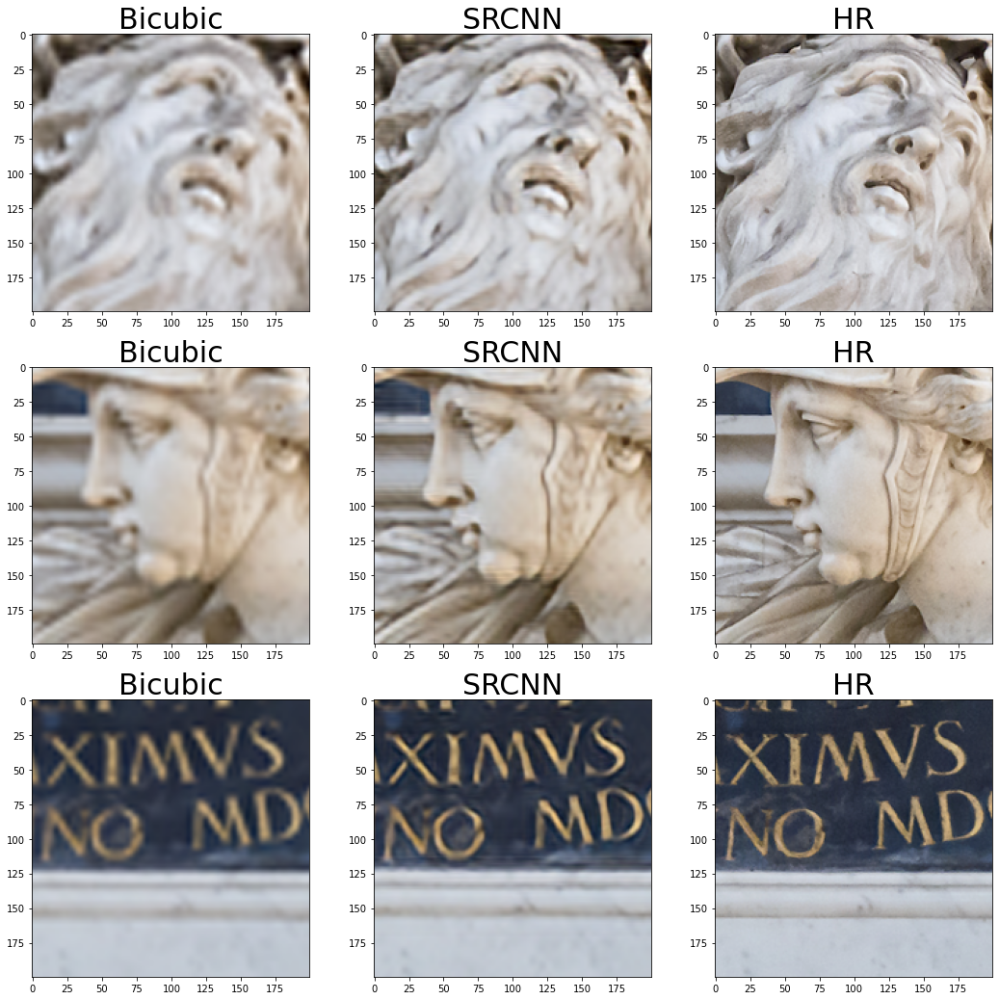

In [15]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srcnn_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRCNN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

시각화 결과 bicubic interpolation 결과보다 조금 더 선명해졌지만 원래 고해상도 이미지에 비해 만족할만한 성능은 아닌 것 같다. DIV2K 데이터셋이 비교적 세밀한 구조의 이미지가 많아 SRCNN과 같이 간단한 구조로는 더 이상 학습되지 않는 것으로 보인다.

실제로 SRCNN 논문에서는 아래와 같이 비교적 간단한 구조의 이미지에 대해서는 꽤나 만족할 만한 성능을 보여준다.

<img src="./image/srcnn_result.png" alt="srcnn_result" />

다음 단계에서는 조금 더 강력한 모델에 대해서 알아보고 실험해보자.

## 9. Deep Learning을 이용한 Super Resolution (3) SRGAN
이번에는 __GAN(Generative Adversarial Networks)__ 을 활용한 Super Resolution 과정에 대해 다뤄보려 한다. 고해상도 이미지를 만들어 내는 데 GAN이 어떻게 활용될 수 있고, 이를 활용했을 때 어떠한 장점이 있는지 학습을 통해 알아보자.

### 다시 한번, GAN
---
이번 학습을 시작하기 전에 GAN을 대략적으로 알고 있다고 전제 했지만, GAN에 대해 다시 한번 가볍게 정리해 보겠다. 아래 참고 자료를 읽어보자.

* 참고 자료: [GAN - 스스로 학습하는 인공지능](https://www.samsungsds.com/kr/insights/Generative-adversarial-network-AI.html?referrer=https://aiffelstaticprd.blob.core.windows.net/contents/CodeTemplate.html)
<br><br>
* 데이터의 확률분포를 모델링 할 수 있다면 원래 데이터와 확률분포를 정확히 공유하는 무한히 많은 새로운 데이터를 생성할 수 있다.

__GAN의 학습이 완료되었을 때, Generator(생성자)와 Discriminator(판별자)의 출력__
* Generator의 경우 원 데이터의 확률분포를 따르는 새로운 데이터를 만들며, Discriminator의 경우 분류에 의미가 없는 0.5의 확률값을 출력한다.

아래 자료는 위 참고 자료에 이어 GAN에 대해 조금 더 자세히 설명한 자료입니다. 마찬가지로 읽고 질문에 답해봅시다.

* 참고 자료: [GAN - GAN의 개념과 이해
](https://www.samsungsds.com/kr/insights/Generative-adversarial-network-AI-2.html?referrer=https://aiffelstaticprd.blob.core.windows.net/contents/CodeTemplate.html)

__비지도학습의 의미와 일맥상통하는 물리학자 Richard Feynman 의 명언__
* What I cannot create, I do not understand

__GAN을 경찰과 위조지폐범으로 비유한다면...__
* 위조지폐범은 Generator(생성자, 생성모델)에 해당하며, 위조지폐를 잘 만들어 경찰을 속이고자 한다. 경찰은 Discriminator(판별자, 판별모델, 분류모델)에 해당하며, 진짜 지폐와 위조지폐를 정확히 구분하여 위조지폐범을 검거하고자 한다.

### SRGAN = Super Resoultion + GAN
---
최근 Super Resolution 분야에서 GAN은 매우 많이 활용되고 있다. 이번에는 가장 처음으로 Super Resolution에 GAN을 이용한 연구인 SRGAN에 대해 알아보겠다. SRGAN은 2016년 발표된 "Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network" 논문에서 제안되었으며, 아래 그림과 같이 이전에 학습한 SRCNN 보다 조금 복잡한 구조를 갖는다. 논문 제목부터 "Photo-Realistic"이라 쓰여있으니 얼마나 좋은 결과가 나올지 기대가 되는 부분이다.

<img src="./image/srgan.png" alt="SRGAN" />

그림의 Generator Network와 Discriminator Network는 각각 위에서 비유했던 위조지폐범(생성 모델)과 경찰(분류/판별 모델)이다.<br> Generator가 저해상도 이미지를 입력 받아 (가짜)고해상도 이미지를 생성해 내면, Discriminator는 생성된 (가짜)고해상도 이미지와 실제(진짜) 고해상도 이미지 중 진짜를 판별한다.

Generator는 Discriminator를 속이려하고 Discriminator는 진짜를 가려내려는 학습이 진행될 수록 서로 경쟁자가 되어 둘 모두가 점점 발전한다. 학습이 거의 완료 되면 최종적으로 Generator가 생성해낸 (가짜)고해상도 이미지는 Discriminator가 진짜인지 가짜인지를 구분하기 힘들 정도로 매우 좋은 품질을 가진 고해상도 이미지가 된다.


SRGAN에서 사용하는 loss function은 아래와 같이 조금 특별하다.

<img src="./image/srgan_loss.png" alt="srgan_loss" />

위 식을 보면 크게 content loss와 adversarial loss로 구성되어 있고, 이 중 adversarial loss는 우리가 일반적으로 알고 있는 GAN의 loss이며, 조금 특별한 부분은 아래 그림으로 나타낸 content loss 부분이다.

<img src="./image/srgan_vgg.png" alt="srgan_vgg" />

`content loss`는 Generator를 이용해 얻어낸 (가짜) 고해상도 이미지를 실제 (진짜) 고해상도 이미지와 직접 비교하는 것이 아니라, 각 이미지를 이미지넷으로 사전 학습된(pre-trained) VGG 모델에 입력하여 나오는 feature map에서의 차이를 계산한다.<br>
즉, 이전에 학습했던 SRCNN은 생성해낸 고해상도 이미지를 원래 고해상도 이미지와 직접 비교하여 loss를 계산했지만, SRGAN에서는 생성된 고해상도 이미지와 실제 고해상도 이미지를 VGG에 입력하여 모델 중간에서 추출해낸 특징을 비교해서 loss를 계산한다.<br>
SRGAN은 VGG를 이용한 `content loss` 및 GAN을 사용함으로써 발생하는 `adversarial loss`를 합하여 최종적으로 `perceptual loss`라고 정의하며 이를 학습에 이용한다.
이렇게 복잡한 손실 함수를 정의한 이유가 무엇일까? 우선 다음 단계에서 SRGAN을 실험해 보고 이러한 손실 함수를 사용한 장점에 대해 다뤄보겠다.

## 10. SRGAN을 이용해 Super Resolution 도전하기
SRCNN에 이어서 간략하게 알아본 SRGAN을 구현하고 실험해보자. 마찬가지로 이전 SRCNN에 사용했던 DIV2K 데이터셋을 사용한다.

>_SRCNN과 마찬가지로 아래에서 진행하는 SRGAN의 학습 과정은 간단한 과정만을 거치며 실제 SRGAN 논문에서 진행한 실험 과정과 세부적으로 차이가 있다. 이에 대한 자세한 내용은 SRGAN의 논문 참고._

### 데이터 준비하기
---
SRCNN은 저해상도 이미지에 대해 interpolation하여 고해상도 이미지 크기로 맞춘 후 입력으로 사용했지만, SRGAN은 그러한 과정을 거치지 않는다.

In [16]:
train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)
def preprocessing(lr, hr):
    hr = tf.cast(hr, tf.float32) /255.
        
    # 이미지의 크기가 크므로 (96,96,3) 크기로 임의 영역을 잘라내어 사용합니다.
    hr_patch = tf.image.random_crop(hr, size=[96,96,3])
        
    # 잘라낸 고해상도 이미지의 가로, 세로 픽셀 수를 1/4배로 줄입니다
    # 이렇게 만든 저해상도 이미지를 SRGAN의 입력으로 사용합니다.
    lr_patch = tf.image.resize(hr_patch, [96//4, 96//4], "bicubic")
    return lr_patch, hr_patch

train = train.map(preprocessing).shuffle(buffer_size=10).repeat().batch(8)
valid = valid.map(preprocessing).repeat().batch(8)

### SRGAN 구현하기
---
먼저, 저해상도 이미지를 입력받아 고해상도 이미지를 생성하는 Generator를 구현해보자 SRGAN의 Generator 부분은 아래와 같다.

<img src="./image/srgan_gene.png" alt="SRGAN" />

그림 내의 `k9n64s1`라는 표기는 Convolutional layer 내의 hyperparameter 설정에 대한 정보이며, k는 kernel size, n은 사용 필터의 수, s는 stride를 나타낸다. Tensorflow로 구현한다면 `Conv2D(filters=64, kernel_size=9, strides=1, padding="same")` 처럼 작성할 수 있다. 추가로 모든 stride가 1인 convolutional layer에는 패딩을 통해 출력의 크기를 계속 유지한다.

SRGAN의 Generator에는 skip-connection을 가지고 있으며, 이는 Sequential API로 구현할 수 없으므로 Functional API를 이용해 아래와 같이 구현해보겠다. 위 Generator 그림에서 각 layer를 따라 비교하면서 아래 코드를 이해해보자.

In [17]:
from tensorflow.keras import Input, Model

# 그림의 파란색 블록을 정의합니다.
def gene_base_block(x):
    out = layers.Conv2D(64, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.PReLU(shared_axes=[1,2])(out)
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.Add()([x, out])

# 그림의 뒤쪽 연두색 블록을 정의합니다.
def upsample_block(x):
    out = layers.Conv2D(256, 3, 1, "same")(x)
    # 그림의 PixelShuffler 라고 쓰여진 부분을 아래와 같이 구현합니다.
    out = layers.Lambda(lambda x: tf.nn.depth_to_space(x, 2))(out)
    return layers.PReLU(shared_axes=[1,2])(out)
    
# 전체 Generator를 정의합니다.
def get_generator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 9, 1, "same")(inputs)
    out = residual = layers.PReLU(shared_axes=[1,2])(out)
    
    for _ in range(5):
        out = gene_base_block(out)
    
    out = layers.Conv2D(64, 3, 1, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.Add()([residual, out])
    
    for _ in range(2):
        out = upsample_block(out)
        
    out = layers.Conv2D(3, 9, 1, "same", activation="tanh")(out)
    return Model(inputs, out)

이번에는 생성된 고해상도 이미지와 진짜 고해상도 이미지 사이에서 진짜를 판별해내는 Discriminator를 아래 그림에 따라 구현해보겠다. 마찬가지로 Functional API를 사용한다.

<img src="./image/srgan_disc.png" alt="SRGAN" />

In [18]:
# 그림의 파란색 블록을 정의합니다.
def disc_base_block(x, n_filters=128):
    out = layers.Conv2D(n_filters, 3, 1, "same")(x)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(n_filters, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    return layers.LeakyReLU()(out)

# 전체 Discriminator 정의합니다.
def get_discriminator(input_shape=(None, None, 3)):
    inputs = Input(input_shape)
    
    out = layers.Conv2D(64, 3, 1, "same")(inputs)
    out = layers.LeakyReLU()(out)
    out = layers.Conv2D(64, 3, 2, "same")(out)
    out = layers.BatchNormalization()(out)
    out = layers.LeakyReLU()(out)
    
    for n_filters in [128, 256, 512]:
        out = disc_base_block(out, n_filters)
    
    out = layers.Dense(1024)(out)
    out = layers.LeakyReLU()(out)
    out = layers.Dense(1, activation="sigmoid")(out)
    return Model(inputs, out)

SRGAN은 VGG19를 이용해 content loss를 계산한다. Tensorflow는 이미지넷 데이터로부터 잘 학습된 VGG19를 제공하고 있으며 이를 이용해보겠다.

In [19]:
from tensorflow.python.keras import applications
def get_feature_extractor(input_shape=(None, None, 3)):
    vgg = applications.vgg19.VGG19(
        include_top=False, 
        weights="imagenet", 
        input_shape=input_shape
    )
    # 아래 vgg.layers[20]은 vgg 내의 마지막 convolutional layer 입니다.
    return Model(vgg.input, vgg.layers[20].output)

### SRGAN 학습하기
---
이제부터는 앞에서 정의한 신경망들을 이용해 SRGAN을 학습해 보겠다. 이전에 SRCNN과 마찬가지로 학습에 꽤나 오랜 시간이 소요되므로 SRGAN의 학습을 처음부터 전부 진행하진 않을 것이다. 여기서는 200번의 반복만 진행해보겠다.<br>
(초반 학습이 불안정하여 Generator의 loss가 증가할 수도 있다)

In [20]:
from tensorflow.keras import losses, metrics, optimizers

generator = get_generator()
discriminator = get_discriminator()
vgg = get_feature_extractor()

# 사용할 loss function 및 optimizer 를 정의합니다.
bce = losses.BinaryCrossentropy(from_logits=False)
mse = losses.MeanSquaredError()
gene_opt = optimizers.Adam()
disc_opt = optimizers.Adam()

def get_gene_loss(fake_out):
    return bce(tf.ones_like(fake_out), fake_out)

def get_disc_loss(real_out, fake_out):
    return bce(tf.ones_like(real_out), real_out) + bce(tf.zeros_like(fake_out), fake_out)


@tf.function
def get_content_loss(hr_real, hr_fake):
    hr_real = applications.vgg19.preprocess_input(hr_real)
    hr_fake = applications.vgg19.preprocess_input(hr_fake)
    
    hr_real_feature = vgg(hr_real) / 12.75
    hr_fake_feature = vgg(hr_fake) / 12.75
    return mse(hr_real_feature, hr_fake_feature)


@tf.function
def step(lr, hr_real):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        hr_fake = generator(lr, training=True)
        
        real_out = discriminator(hr_real, training=True)
        fake_out = discriminator(hr_fake, training=True)
        
        perceptual_loss = get_content_loss(hr_real, hr_fake) + 1e-3 * get_gene_loss(fake_out)
        discriminator_loss = get_disc_loss(real_out, fake_out)
        
    gene_gradient = gene_tape.gradient(perceptual_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(discriminator_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return perceptual_loss, discriminator_loss


gene_losses = metrics.Mean()
disc_losses = metrics.Mean()

for epoch in range(1, 2):
    for i, (lr, hr) in enumerate(train):
        g_loss, d_loss = step(lr, hr)
        
        gene_losses.update_state(g_loss)
        disc_losses.update_state(d_loss)
        
        # 10회 반복마다 loss를 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \nGenerator_loss:{gene_losses.result():.4f} \nDiscriminator_loss:{disc_losses.result():.4f}", end="\n\n")
        
        if (i+1) == 200:
            break
            
    gene_losses.reset_states()
    disc_losses.reset_states()

EPOCH[1] - STEP[10] 
Generator_loss:0.0011 
Discriminator_loss:1.8077

EPOCH[1] - STEP[20] 
Generator_loss:0.0011 
Discriminator_loss:1.4457

EPOCH[1] - STEP[30] 
Generator_loss:0.0013 
Discriminator_loss:1.1289

EPOCH[1] - STEP[40] 
Generator_loss:0.0017 
Discriminator_loss:0.9251

EPOCH[1] - STEP[50] 
Generator_loss:0.0022 
Discriminator_loss:0.7868

EPOCH[1] - STEP[60] 
Generator_loss:0.0026 
Discriminator_loss:0.6852

EPOCH[1] - STEP[70] 
Generator_loss:0.0030 
Discriminator_loss:0.6454

EPOCH[1] - STEP[80] 
Generator_loss:0.0033 
Discriminator_loss:0.6236

EPOCH[1] - STEP[90] 
Generator_loss:0.0035 
Discriminator_loss:0.5607

EPOCH[1] - STEP[100] 
Generator_loss:0.0037 
Discriminator_loss:0.5065

EPOCH[1] - STEP[110] 
Generator_loss:0.0039 
Discriminator_loss:0.4612

EPOCH[1] - STEP[120] 
Generator_loss:0.0041 
Discriminator_loss:0.4232

EPOCH[1] - STEP[130] 
Generator_loss:0.0043 
Discriminator_loss:0.3909

EPOCH[1] - STEP[140] 
Generator_loss:0.0045 
Discriminator_loss:0.3632

E

### SRGAN 테스트하기
---
SRGAN이 만족스러운 결과를 도출할 때까지는 상당히 많은 학습 시간을 요구한다. 이전과 마찬가지로 이미 학습이 완료된 SRGAN을 미리 준비해 놓았다. 이를 이용해 테스트해보자.

SRGAN은 크게 두 개의 신경망(Generator, Discriminator)으로 구성되어 있지만, 테스트에는 저해상도 입력을 넣어 고해상도 이미지를 출력하는 Generator만 이용한다. 아래 `srgan_G.h5` 파일은 학습이 완료된 Generator이며, 이를 다운로드받아 코드를 실행해 학습 완료된 모델을 불러온다.

```bash
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srgan_G.h5
$ mv srgan_G.h5 ~/AIFFEL/Exploration/Practice/P16_SRGAN/super_resolution
```

In [21]:
import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/AIFFEL/Exploration/Practice/P16_SRGAN/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

아래 코드와 같이 테스트 과정을 진행하는 함수를 간단하게 정의하고, 이 함수를 이용해 이전에 사용했던 이미지에 대해 SRGAN의 고해상도 결과를 생성한다.

In [22]:
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True
)

for i, (lr, hr) in enumerate(valid):
    if i == 6: break

srgan_hr = apply_srgan(lr)

이미지 전체를 시각화했을 때 세부적인 선명함이 눈에 띄지 않았기 때문에, 일부 영역을 잘라내어 시각적으로 비교해보겠다. 아래 코드를 이용해 3개 이미지(bicubic interpolation의 결과, SRGAN의 결과, 원래 고해상도 이미지)를 나란히 시각화한다.

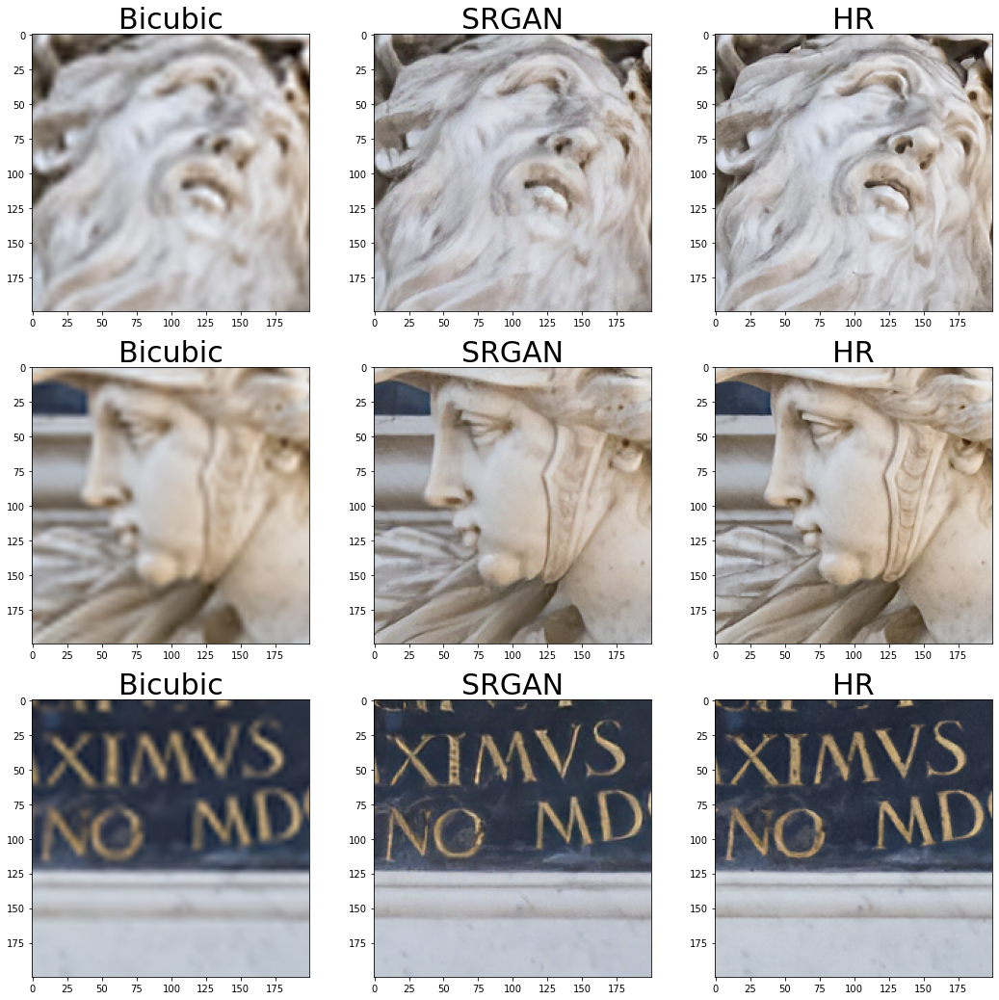

In [23]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(400,500), (300,1200), (0,1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

시각화 결과 bicubic interpolation보다 훨씬 더 원래 고해상도 이미지에 가까운, 꽤나 만족할만한 결과를 얻은 것 같다. 이전에 사용했던 SRCNN 보다 더 깊은 신경망 구조를 사용했고, GAN 및 VGG 구조를 이용한 손실 함수를 사용해 복잡하게 학습 과정을 구성한 보람이 있다.

<img src="./image/srgan_exp.png" alt="SRGAN" />

위 그림은 SRGAN 논문에서 세부적으로 실험한 결과를 나타낸다. 가장 첫 번째 SRResNet은 SRGAN의 Generator를 뜻하며, Generator 구조만 이용해 SRCNN과 비슷하게 MSE 손실함수로 학습한 결과이다. 오른쪽으로 갈수록 GAN 및 VGG 구조를 이용하여 점점 더 이미지 내 세부적인 구조가 선명해짐을 알 수 있다. (VGG22는 VGG54에 비해 더 low-level의 특징에서 손실을 계산했다)

다음 단계에서는 Super Resolution 결과를 평가하는 방법에 대해서 알아보고 SRCNN과 SRGAN 결과를 직접 비교해보자.

## 11. Super Resolution 결과 평가하기
Super Resolution 결과가 얼마나 좋은지 많은 연구들에서 사용되는 정량적인 평가 척도가 몇 가지 있다. 이번에는 이러한 척도에 대해 간략하게 알아보고 이를 활용해 앞서 진행한 SRCNN과 SRGAN 모델 각각이 만들어낸 고해상도 이미지를 비교해보자.

### PSNR과 SSIM
---
__PSNR__(Peak Signal-to-Noise Ratio)은 영상 내 신호가 가질 수 있는 최대 신호에 대한 잡음(noise)의 비율을 나타낸다. 일반적으로 영상을 압축했을 때 화질이 얼마나 손실되었는지 평가하는 목적으로 사용된다. 데시벨(db) 단위를 사용하며, PSNR 수치가 높을수록 원본 영상에 비해 손실이 적다는 의미이다. (값이 높을수록 좋다).

__SSIM__(Structural Similarity Index Map)은 영상의 구조 정보를 고려하여 얼마나 구조 정보를 변화시키지 않았는지를 계산한다. 특정 영상에 대한 SSIM값이 높을수록 원본 영상의 품질에 가깝다는 의미이다. (마찬가지로 값이 높을수록 좋다).

PSNR과 SSIM 결과가 높을수록 비교하려는 영상이 원본 영상 품질에 가깝다는 사실만 알고 넘어가고, 이에 대해 자세히 이해하고자 한다면 아래 자료를 참고하자.

* 참고 자료: [최대신호대잡음비(PSNR)와 이미지 품질](https://bskyvision.com/392)
* 참고 자료: [2D 이미지 품질 평가에 구조변화를 반영하는 SSIM과 그의 변형들](https://bskyvision.com/396)

PSNR과 SSIM은 scikit-image 라이브러리를 이용해 쉽게 계산할 수 있다. 아래 코드를 따라서 간단하게 실험해보자. 이전에 보았던 고양이를 다시 데려오겠다.

(300, 451, 3)


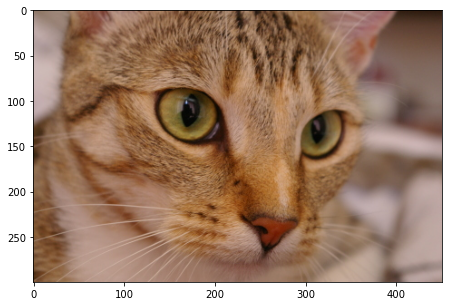

In [24]:
from skimage import data
import matplotlib.pyplot as plt

hr_cat = data.chelsea() # skimage에서 제공하는 예제 이미지를 불러옵니다.
hr_shape = hr_cat.shape[:2]

print(hr_cat.shape) # 이미지의 크기를 출력합니다.

plt.figure(figsize=(8,5))
plt.imshow(hr_cat)

동일한 이미지로 PSNR과 SSIM을 계산해 보겠다. 아래 코드와 같이 `peak_signal_noise_ratio` , `structural_similarity` 두 메서드를 이용하면 쉽게 계산할 수 있다.

In [25]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

print("**동일 이미지 비교**")
print("PSNR :", peak_signal_noise_ratio(hr_cat, hr_cat))
print("SSIM :", structural_similarity(hr_cat, hr_cat, multichannel=True))

**동일 이미지 비교**
PSNR : inf
SSIM : 1.0


/home/aiffel-dj10/anaconda3/envs/aiffel/lib/python3.7/site-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


PSNR과 SSIM 모두 높은 값을 가질수록 원본 이미지와 가깝다는 것을 의미하며, 동일한 이미지를 비교했기 때문에 두 결과는 각각 가질 수 있는 최댓값을 가진다. PSNR은 상한값이 없고, SSIM은 0~1 사이의 값을 가지기 때문에 각각 inf와 1이 계산된다.

이번에는 아래 코드를 이용해 고양이의 가로 세로 픽셀 수를 각각 1/2, 1/4, 1/8로 줄이고, bicubic interpolation을 이용해 원래 크기로 복원해 보겠다. 각각 처리된 이미지에 대해 원본 이미지와의 PSNR과 SSIM을 계산하고 그 결과를 제목에 표시해 보겠다.

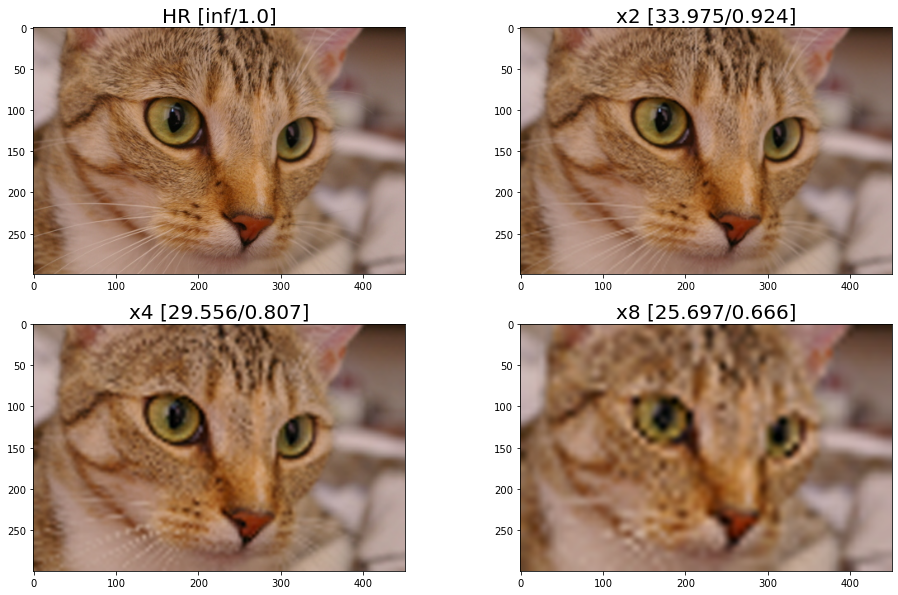

In [26]:
import cv2

# 이미지를 특정 크기로 줄이고 다시 늘리는 과정을 함수로 정의합니다.
def interpolation_xn(image, n):
    downsample = cv2.resize(
        image,
        dsize=(hr_shape[1]//n, hr_shape[0]//n)
    )
    upsample = cv2.resize(
        downsample,
        dsize=(hr_shape[1], hr_shape[0]),
        interpolation=cv2.INTER_CUBIC
    )
    return upsample

lr2_cat = interpolation_xn(hr_cat, 2) # 1/2로 줄이고 다시 복원
lr4_cat = interpolation_xn(hr_cat, 4) # 1/4로 줄이고 다시 복원
lr8_cat = interpolation_xn(hr_cat, 8) # 1/8로 줄이고 다시 복원

images = [hr_cat, lr2_cat, lr4_cat, lr8_cat]
titles = ["HR", "x2", "x4", "x8"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_cat, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_cat, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(16,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

각 이미지의 제목에 PSNR과 SSIM이 순서대로 나타났다. 해상도를 줄일수록 그 이미지를 원래 크기로 interploation 했을 때, 각각의 계산 결과가 눈에 띄게 감소하는 것을 알 수 있다.

## 12. SRCNN 및 SRGAN 결과 비교하기
이번에는 앞서 실험했던 SRCNN과 SRGAN의 결과를 먼저 시각적으로만 비교해보겠다. 이전에 불러온 DIV2K 데이터셋 내에서 학습에 사용하지 않은 검증용 데이터셋을 이용하며, 몇 개 이미지만 뽑아서 Super Resolution을 진행한 후 특정 부분을 잘라내어 확대해보자.

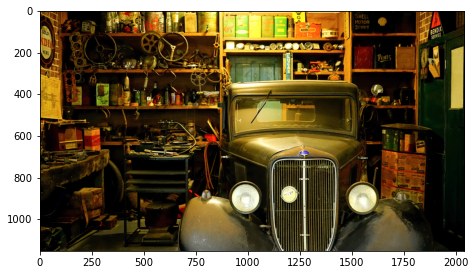

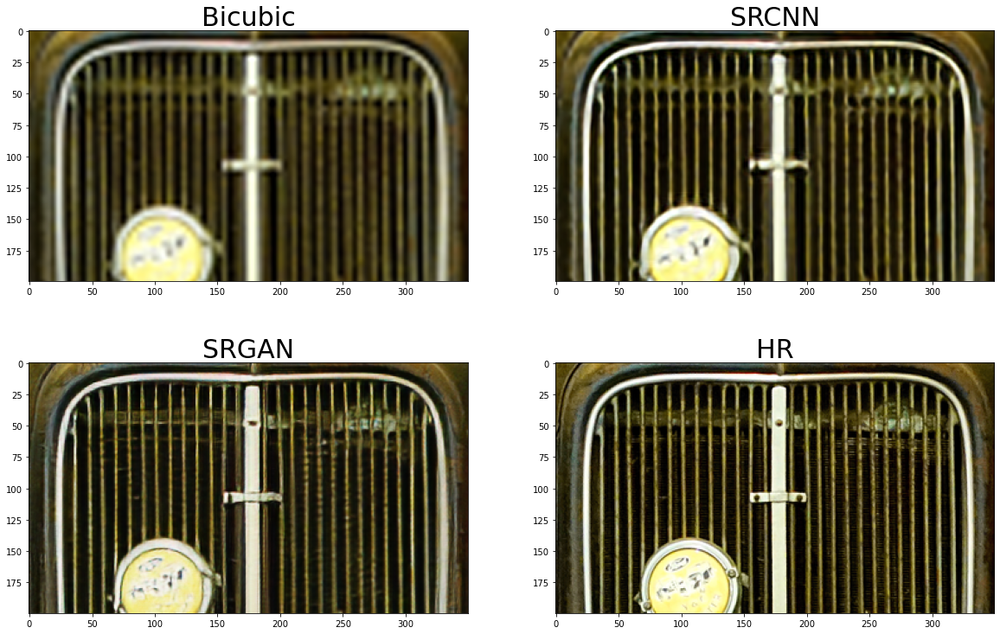

In [27]:
for i, (lr, hr) in enumerate(valid):
    if i == 12: break # 12번째 이미지를 불러옵니다.

lr_img, hr_img = np.array(lr), np.array(hr)

# bicubic interpolation
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

# 전체 이미지를 시각화합니다.
plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

# SRCNN을 이용해 고해상도로 변환합니다.
srcnn_img = apply_srcnn(bicubic_img)

# SRGAN을 이용해 고해상도로 변환합니다.
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1090) # 잘라낼 부분의 왼쪽 상단 좌표를 지정합니다.

# bicubic, SRCNN, SRGAN 을 적용한 이미지와 원래의 고해상도 이미지를 시각화합니다.
plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

자동차의 앞부분을 잘라내어 확대했다. HR이라는 제목을 가진 고해상도 이미지와 비교할 때, Bicubic과 SRCNN은 많이 흐릿하지만 SRGAN의 결과는 매우 비슷하다.

아래 코드를 실행하면서 몇 가지 이미지에 대해 동일한 과정으로 비교해보자.

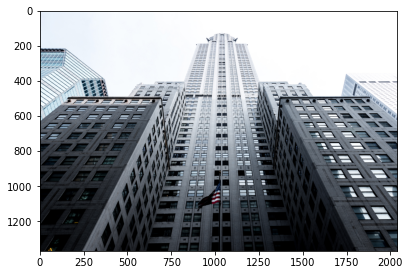

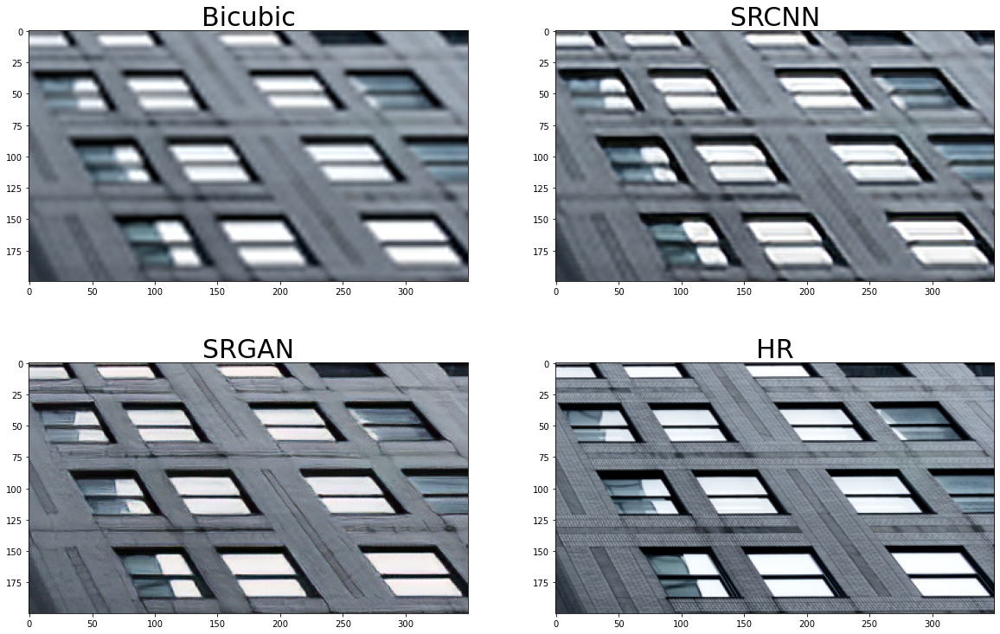

In [28]:
for i, (lr, hr) in enumerate(valid):
    if i == 15: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (600, 1500)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

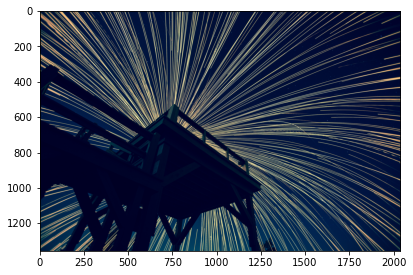

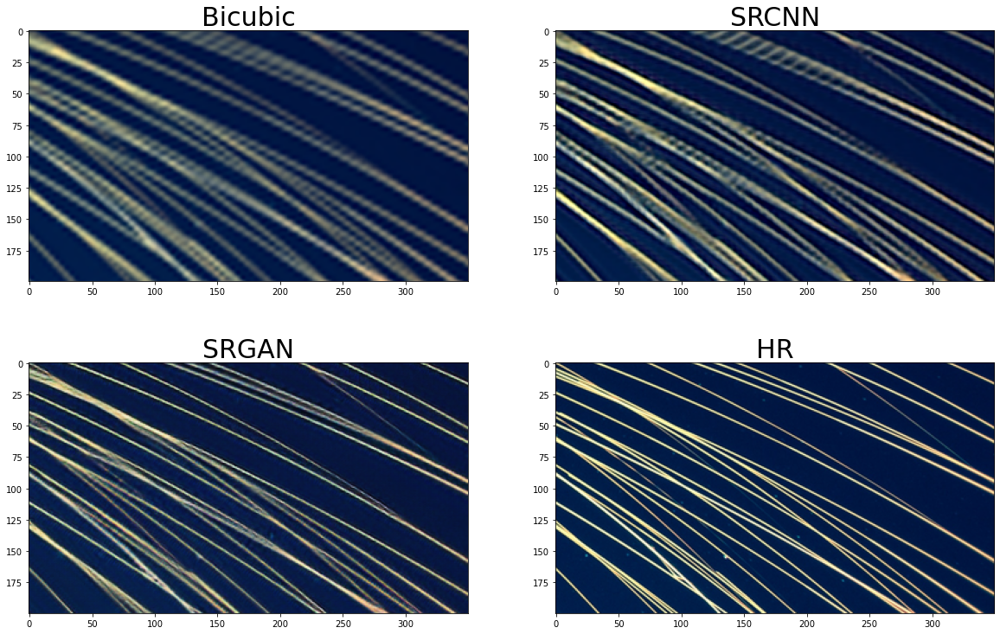

In [29]:
for i, (lr, hr) in enumerate(valid):
    if i == 8: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (900, 1500)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

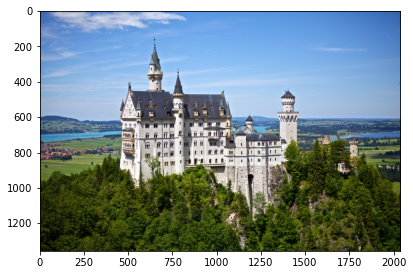

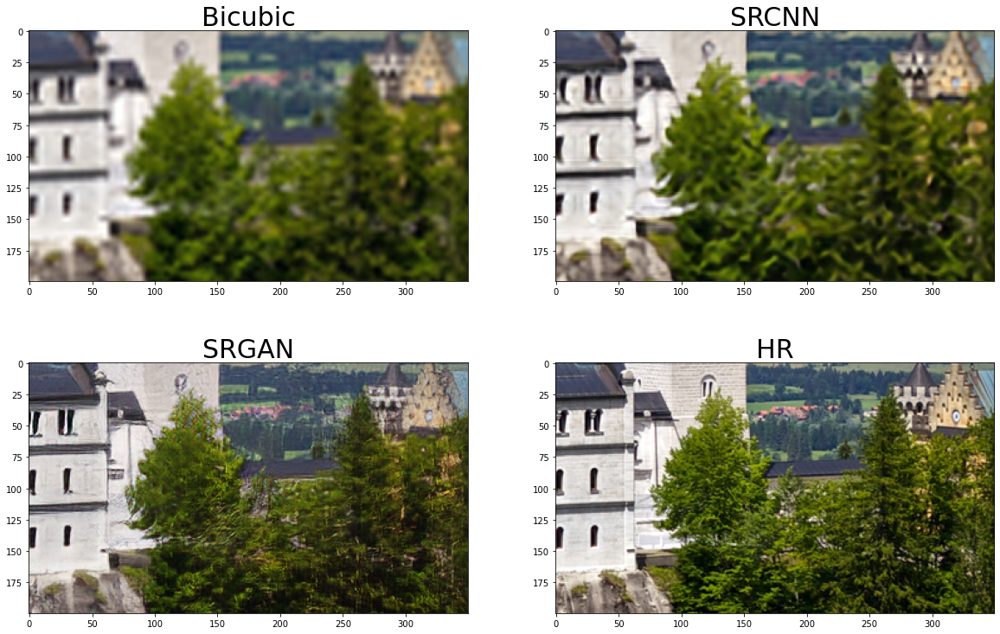

In [30]:
for i, (lr, hr) in enumerate(valid):
    if i == 24: break

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

left_top = (700, 1300)

plt.figure(figsize=(20,20))
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

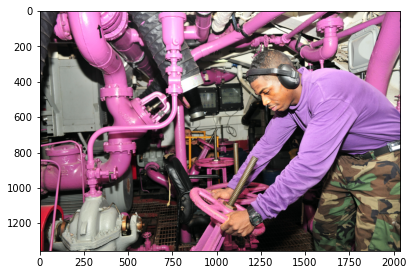

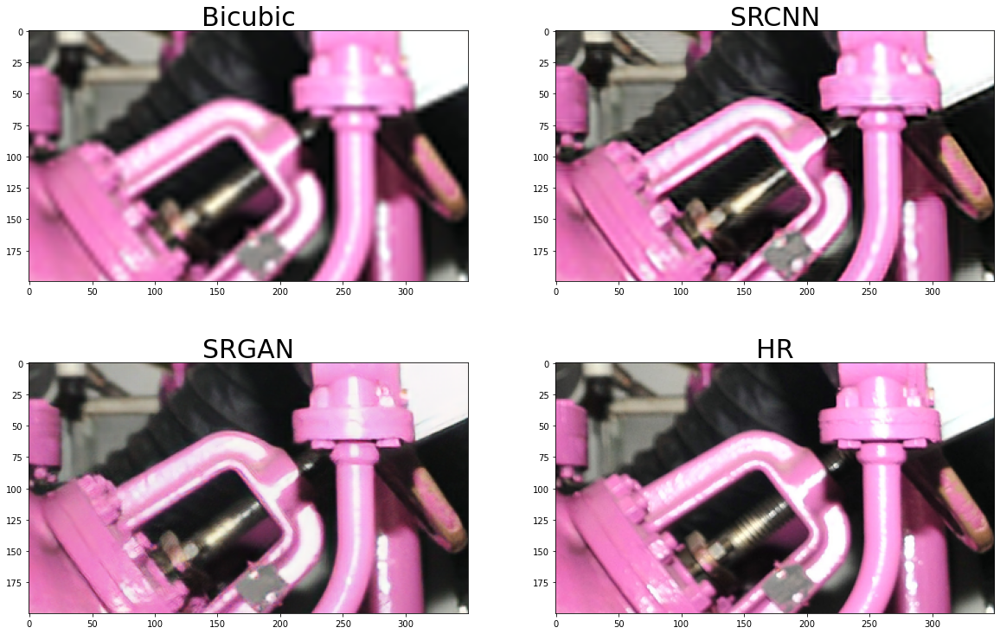

In [31]:
for i, (lr, hr) in enumerate(valid):
    # 불러올 이미지의 인덱스를 지정합니다.
    # 위에서 시각화 했던 8, 12, 15, 24 번을 제외한 다른 숫자를 넣어봅시다 
    if i == 10 :
        break          

lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img, 
    (hr.shape[1], hr.shape[0]), 
    interpolation=cv2.INTER_CUBIC
)

plt.figure(figsize=(20,15))
plt.subplot(311); plt.imshow(hr_img)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

# 잘라낼 부분의 왼쪽 상단 좌표를 지정합니다.
left_top = (400, 500)

plt.figure(figsize=(20,20)) # 이미지 크기를 조절할 수 있습니다.
for i, pind in enumerate([321, 322, 323, 324]):
    plt.subplot(pind)
    # crop 함수 내의 세번째 네번째 인자를 수정해 이미지 크기를 조절합니다.
    plt.imshow(crop(images[i], left_top, 200, 350))
    plt.title(titles[i], fontsize=30)

이번에는 각 Super Resolution 결과와 원래 고해상도 이미지 사이의 PSNR, SSIM을 계산해보겠다. 이전과 마찬가지로 아래 코드를 이용해 각 이미지의 제목에 평가 결과를 함께 표시하도록 한다.

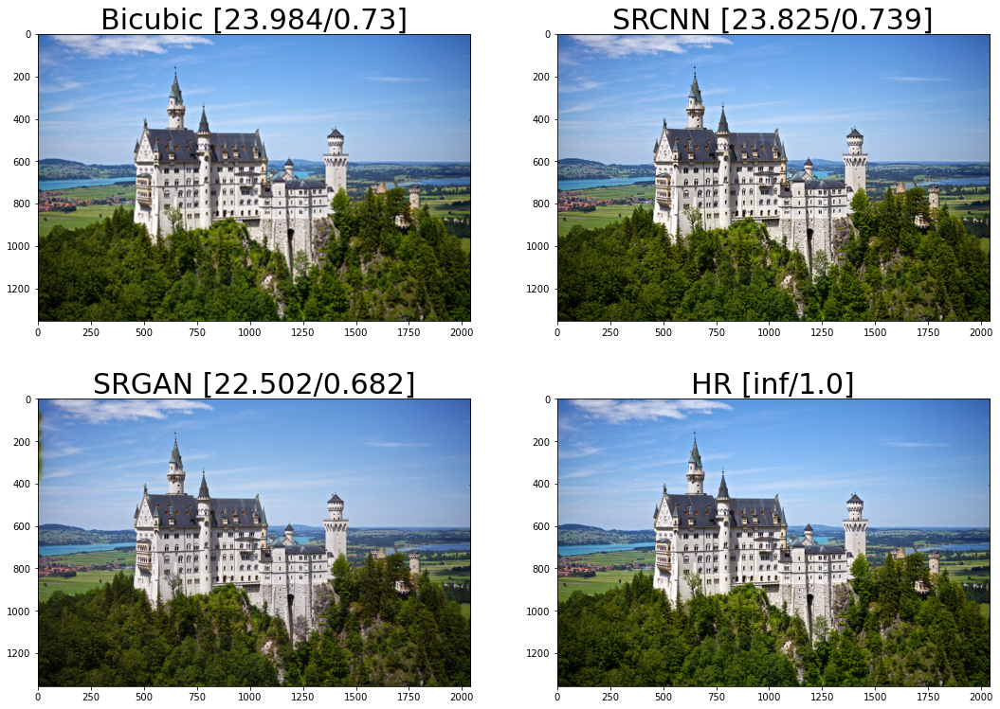

In [32]:
for i, (lr, hr) in enumerate(valid):
    if i == 24: break
    
lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)

images = [bicubic_img, srcnn_img, srgan_img, hr_img]
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_img, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_img, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(18,13))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

어떻게 된 일인지 시각적으로 가장 고해상도 이미지에 가까웠던 SRGAN의 결과가 다른 방법들에 비해 낮은 PSNR과 SSIM 결과를 가진다. 아래에서 이 이미지에 대해 특정 부분을 잘라내고, 잘라낸 이미지로 PSNR, SSIM을 계산해보자.

건물의 창문 부분을 잘라 자세히 보자.

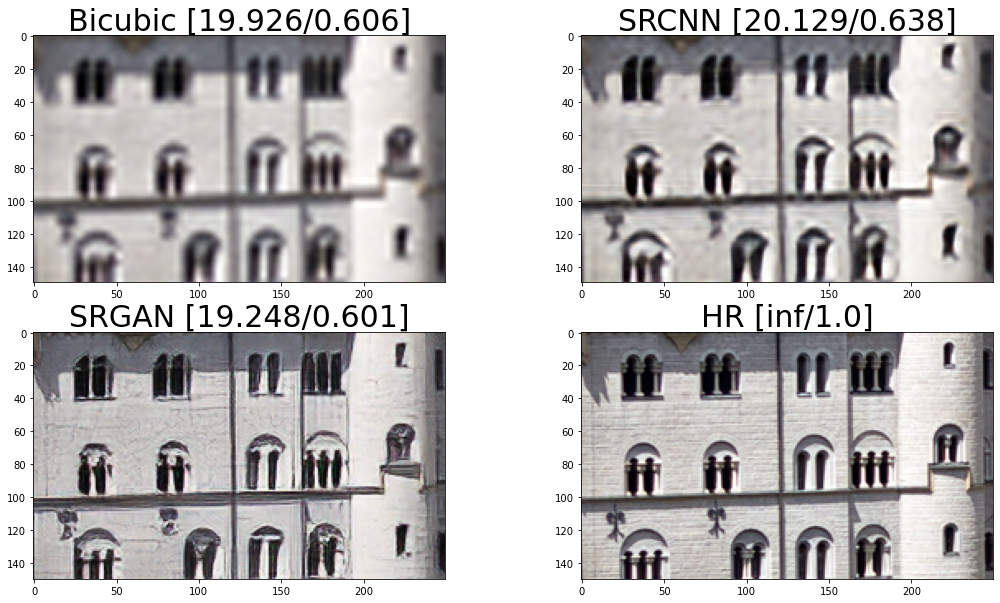

In [33]:
left_top = (620, 570)
crop_images = [crop(i, left_top, 150, 250) for i in images]

psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]

plt.figure(figsize=(18,10))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

SRCNN 결과의 경우 약간 선명해졌지만 전체적으로 여전히 고해상도 영상에 비해 흐릿하다. SRCNN의 학습에 `Mean Squared Error`를 사용했기 때문에, 생성해야 할 픽셀 값들을 고해상도 이미지와 비교해 단순히 평균적으로 잘 맞추는 방향으로 예측했기 때문이다. 이러한 문제는 SRCNN 뿐만 아니라 MSE만을 사용해 학습하는 대부분의 신경망에서 발생하는 현상이기도 하다.

SRGAN 결과의 경우 매우 선명하게 이상함을 확인할 수 있다. 이는 Generator가 고해상도 이미지를 생성하는 과정에서 Discriminator를 속이기 위해 이미지를 진짜 같이 선명하게 만들도록 학습 되었기 때문이다. 추가로 앞서 설명했듯이 VGG구조를 이용한 content loss를 통해 학습한 것 또한 사실적인 이미지를 형성하는데 크게 기여했다고 한다. 다만, 입력되었던 저해상도 이미지가 매우 제한된 정보를 가지고 있기에 고해상도 이미지와 세부적으로 동일한 모양으로 선명하진 않은 것이다.

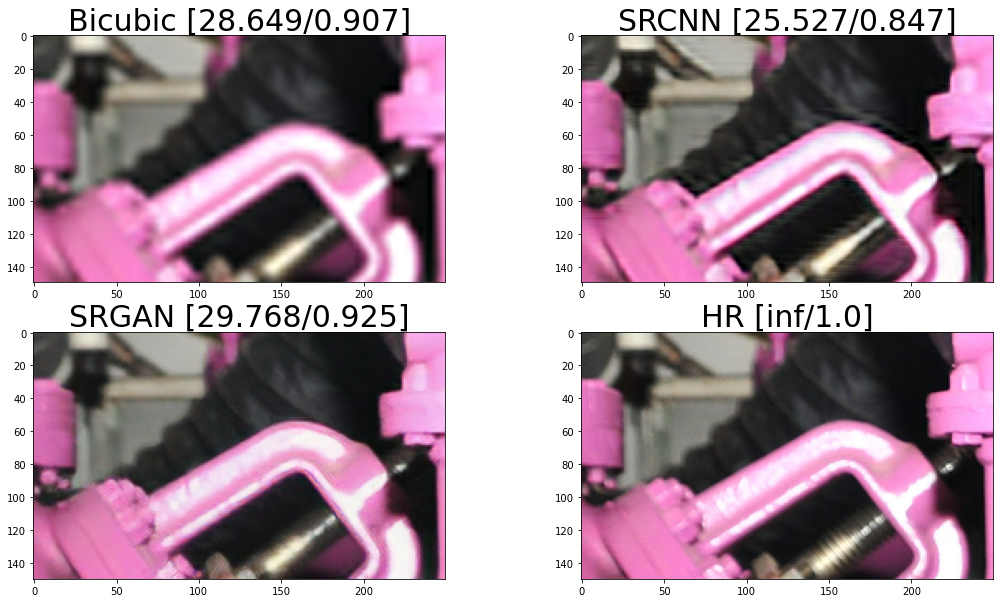

In [34]:
for i, (lr, hr) in enumerate(valid):
    # 불러올 이미지의 인덱스를 지정합니다.
    # 위에서 시각화 했던 8, 12, 15, 24 번을 제외한 다른 숫자를 넣어봅시다 
    if i == 10 : 
        break          
lr_img, hr_img = np.array(lr), np.array(hr)
bicubic_img = cv2.resize(
    lr_img,
    (hr.shape[1], hr.shape[0]),
    interpolation=cv2.INTER_CUBIC
)
# 확대할 부분의 왼쪽 상단 좌표를 지정합니다.
left_top = (400, 500)
srcnn_img = apply_srcnn(bicubic_img)
srgan_img = apply_srgan(lr_img)
images = [bicubic_img, srcnn_img, srgan_img, hr_img]
# crop 함수 내의 세번째 네번째 인자를 수정해 이미지 크기를 조절합니다.
crop_images = [crop(i, left_top, 150, 250) for i in images] 
titles = ["Bicubic", "SRCNN", "SRGAN", "HR"]
psnr = [round(peak_signal_noise_ratio(crop_images[-1], i), 3) for i in crop_images]
ssim = [round(structural_similarity(crop_images[-1], i, multichannel=True), 3) for i in crop_images]
plt.figure(figsize=(18,10)) # 이미지 크기를 조절할 수 있습니다.
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(crop_images[i])
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=30)

## 13. 학습한 내용 정리하기

지금까지 Super Resolution이 무엇인지, 어떻게 활용되는지, 어떠한 딥러닝 기반 연구가 있었는지에 대해 알아보았다. 몇 가지 Super Resolution과 관련된 추가적인 정보들을 가볍게 읽어보고, 마지막으로 걸어온 길을 한번 뒤 돌아보며 학습했던 내용에 대해 정리해 보겠다.

### 다른 이미지를 참고한다면..?
---
이번에는 지금까지 학습한 Super Resolution 방법과는 약간 다른 유형의 방법에 대해 짧게 소개만 드리고 넘어가겠다.

이전에 학습했던 Super Resolution 방법들은 세부적으로 __SISR__(__S__ingle __I__mage __S__uper __R__esolution) 방법에 속한다. 단어 뜻 그대로 한 장의 저해상도 이미지를 이용해 고해상도 이미지를 생성한다는 말이다. 만약 여러 장의 저해상도 이미지를 잘 활용해 고해상도 이미지를 생성한다면 더 좋은 결과를 얻을 수 있지 않을까??

__RefSR__(__Ref__erence-based __S__uper __R__esolution)은 이러한 질문에 답이 될 수 있는 방법 중 하나이다. 모델이 저해상도 이미지만을 받아서 고해상도 이미지를 생성하는 것이 아니라, 해상도를 높이는 데 참고할 만한 다른 이미지를 같이 제공해 주는 것이다.

이런 방법을 활용한 연구 중 _'Image Super-Resolution by Neural Texture Transfer'_ 논문에서 제안한 방법을 사용하면 아래 그림과 같이 매우 선명한 고해상도 이미지를 얻을 수 있다. `Ref images`라고 나타난 두 이미지를 입력으로 Super Resolution을 수행했으며, `SRNTT`라고 나타난 결과를 보면 이전에 학습했던 SRGAN 보다 훨씬 더 선명한 것을 확인할 수 있다.

<img src="./image/srntt_result.png" alt="SRGAN" />

이러한 방법에 대해 자세히 알아보기엔 추가적으로 알아야 할 다른 많은 개념을 필요하므로 이번 학습에서 다루지는 않는다. 위와 같이 여러 개의 저해상도 이미지를 사용해 더 좋은 품질의 고해상도 이미지를 생성하려는 연구 또한 활발히 진행되고 있으며, Super Resolution에 관심이 있다면 꼭 찾아서 공부해 볼 만한 매력적인 방법이다.


### 차별을 재생성하는 인공지능
---
인공지능이 가진 문제들 중 하나는 차별에 관한 것이다. 인공지능 학습에 가장 중요한 영향을 주는 몇 가지 요인들 중 하나는 학습에 사용하는 데이터이며, 이러한 데이터가 편향(bias)을 담고 있다면 그로부터 학습된 인공지능은 아무렇지도 않게 차별을 하게 된다.

예를 들면 아마존이 개발한 인공지능 채용/인사 시스템이 여성에 대해 편견을 가지고 있다는 성차별적 사례가 있었고, 구글의 이미지 인식 모델이 아래 그림과 같이 손의 피부색에 따라 체온계를 총으로 인식하는 인종차별적 사례가 있었다 (백인과 달리 흑인의 손에는 총을 들고 있다고 인식한다.)

<img src="./image/black_white_hands.png" alt="black_white_hands" />

뜬금없이 차별에 대한 얘기를 꺼낸 이유는 오늘 우리가 학습한 Super Resolution 문제에서도 이러한 차별 사례가 있기 때문이다. 문제가 된 방법은 2020년 초에 발표된 PULSE 라는 구조이다. 우선 이 방법은 아래 그림과 같이 Super Resolution 문제에서 매우 좋은 성능을 갖는다. 저해상도 이미지 내에 거의 없는 정보를 완전히 새롭게 생성하는 수준이다.

<img src="./image/pulse_result.png" alt="pulse_result" />

문제는 저해상도의 얼굴 이미지를 입력했을 때, 모두 백인으로 만들어 낸다는 것이다. 아래 첫 번째 그림의 저해상도 이미지는 오바마 전 미국 대통령으로 보이는데, 이를 고해상도로 생성했을 때 결과 이미지로 백인이 등장한다. 저해상도 입력 이미지로 동양인이나 캐릭터를 넣어도 마찬가지로 백인이 생성됨을 아래 그림으로 확인할 수 있다.

<img src="./image/pulse_bad_result.png" alt="pulse_bad_result" />

`PULSE` 의 연구자들은 이러한 현상이 학습했던 데이터셋에서 기인한 것이라 말했다. 백인 위주로 구성된 학습된 데이터로 인해 저해상도 얼굴 이미지에서 만들어야 할 새로운 픽셀들이 기본적으로 흰색에 가깝게 설정되거나, 백인과 비슷한 이목구비가 형성되는 것이다. 어쩌면 백인들이 전 세계 인공지능 연구의 꽤 많은 부분을 차지하고 있기 때문에 이러한 결과가 자연스러운 것 같기도 하다.

이렇게 인공지능에서 나타나는 차별을 줄이고 누구에게나 공정한 인공지능 시스템을 설계하기 위한 연구가 활발하게 진행되고 있다. 이에 대해 관심이 있다면 아래 링크를 읽어보시길 추천한다.

* 참고 자료: [공정한 AI 얼굴인식기]()

### 학습한 내용 정리하기
---
아래 참고 자료는 전반적인 Super Resolution에 대해 잘 설명한 글이다.

* 참고 자료: [Single Image Super Resolution using Deep Learning Overview](https://hoya012.github.io/blog/SIngle-Image-Super-Resolution-Overview/)

__Regular Inverse Problem 혹은 Ill-Posed Problem__

* 저해상도 이미지를 고해상도로 복원할 때, 고해상도 이미지의 정답이 여러 개 존재할 수 있는데 이러한 문제를 Regular Inverse Problem 혹은 Ill-Posed Problem이라 한다.

__Interpolation을 활용해 Super Resolution을 할 때 사용할 수 있는 방법__
* Bilinear, Bicubic 등

__SRCNN과 VDSR의 convolutional layer__
* SRCNN -3
* VDSR - 20

__GAN을 이용한 Super Resolution에서 Generator의 역할__
* 저해상도 이미지를 입력받아 고해상도 이미지를 생성

__SRGAN의 Perceptual Loss를 구성하는 두 가지 loss__
* GAN loss, VGG loss

__Super Resolution 논문에서 사용하는 두 가지 정량적 성능 지표__
* PSNR, SSIM

### 추가 학습 자료
---
이번 학습을 통해 Super Resolution 문제를 해결하는데 흥미가 생겼다면, 아래 영상 자료를 통해 여기서 다루지 못한 자세한 내용을 학습해보자.

* 참고 자료: [PR12 - SRCNN](https://www.youtube.com/watch?v=1jGr_OFyfa0&ab_channel=TaegyunJeon)
* 참고 자료: [PR12 - SRGAN](https://www.youtube.com/watch?v=nGPMKnoJTcI&ab_channel=SeungilKim)
* 참고 자료: [EDSR](https://www.youtube.com/watch?v=OMIqkn2DCUk&ab_channel=naverd2)
* 참고 자료: [딥러닝 Super Resolution 어디까지 왔니?](https://www.youtube.com/watch?v=nvsYKSHw0jo&ab_channel=naverd2)